_This Notebook checks whether the Sentinel-1 and Sentinel-2 datarasters align._

## Importing functions

In [ ]:
from functions.gpkg_funcs import (
    import_gpkg_func,
)

from functions.raster_io_funcs import (
    import_raster_func,
)

from functions.raster_ops_funcs import (
    stich_multiple_rasters_func,
    clip_with_rasterio_func,
    compare_alignment_tifs,
    # reproject_raster_func,
)

from functions.raster_plot_funcs import (
    quick_rstr_plot_func,
)

from functions.s2_import_funcs import (
    s2_raster_imp_func,
    s2_mosaic_import_func,
)

from notebooks_dir._01_pre_processing_sat_obs._support._n01_funcs import (
    get_pixel_raster_func,
    quick_rgb_raster_plot_func,
    raster_pixels_to_gpkg,
)

## Setting directory

In [ ]:
from paths.OG_paths import (
    #######################################
    #          GENERAL POLYGONS           #
    #######################################
    # |         Veluwe polygons           |
    # +===================================+
    # Veluwe n2000
    veluwe_polygon__n2000__RD__gpkg_path,
    veluwe_polygon__n2000__WGS84__gpkg_path,
    veluwe_polygon__n2000__UTM32631__gpkg_path,
    # Veluwe ruim
    veluwe_polygon__ruim__RD__gpkg_path,
    veluwe_polygon__ruim__WGS84__gpkg_path,
    veluwe_polygon__ruim__UTM32631__gpkg_path,


    #######################################
    #      01_pre_processing_sat_obs      #
    #######################################
    # |        n01_exp_sat_raster         |
    # +===================================+
    # --- sentinel 2 test rasters --- #
    # S2 Test1 rasters
    S2_test1_0_UTM32631_raster_path,
    S2_test1_1_UTM32631_raster_path,
    S2_test1_2_UTM32631_raster_path,
    S2_test1_3_UTM32631_raster_path,
    # S2 Test2 rasters
    S2_test2_0_UTM32631_raster_path,
    S2_test2_1_UTM32631_raster_path,
    S2_test2_2_UTM32631_raster_path,
    S2_test2_3_UTM32631_raster_path,
    # S2 mosaic Test1 raster (10m)
    S2M_test1_0_UTM32631_raster_path,
    S2M_test1_1_UTM32631_raster_path,
    S2M_test1_2_UTM32631_raster_path,
    S2M_test1_3_UTM32631_raster_path,
    # S2 mosaic Test2 raster (10m)
    S2M_test2_0_UTM32631_raster_path,
    S2M_test2_1_UTM32631_raster_path,
    S2M_test2_2_UTM32631_raster_path,
    S2M_test2_3_UTM32631_raster_path,

    # --- sentinel 2 Full mosaics ---
	S2_test1_10m_UTM32631_mosaic_path,
	S2_test1_20m_UTM32631_mosaic_path,
	S2_test2_10m_UTM32631_mosaic_path,
	S2_test2_20m_UTM32631_mosaic_path,
	S2M_test1_UTM32631_mosaic_path,
	S2M_test2_UTM32631_mosaic_path,

    # --- sentinel 2 veluwe clip ruim raster ---
    # DIRs
    S2_test1_10m_veluwe_clip_ruim_UTM32631_rstr_dir,
    S2_test1_20m_veluwe_clip_ruim_UTM32631_rstr_dir,
    S2_test2_10m_veluwe_clip_ruim_UTM32631_rstr_dir,
    S2_test2_20m_veluwe_clip_ruim_UTM32631_rstr_dir,
    S2M_test1_veluwe_clip_ruim_UTM32631_rstr_dir,
    S2M_test2_veluwe_clip_ruim_UTM32631_rstr_dir,
    # RSTRs
    S2_test1_10m_veluwe_clip_ruim_UTM32631_rstr_path,
    S2_test1_20m_veluwe_clip_ruim_UTM32631_rstr_path,
    S2_test2_10m_veluwe_clip_ruim_UTM32631_rstr_path,
    S2_test2_20m_veluwe_clip_ruim_UTM32631_rstr_path,
    S2M_test1_veluwe_clip_ruim_UTM32631_rstr_path,
    S2M_test2_veluwe_clip_ruim_UTM32631_rstr_path,

    # --- sentinel 2 basisraster ---
    # DIR
    s2_basisraster__dir,
    # RSTRs
    s2_basisraster__10m__UTM32631__rstr_path,
    s2_basisraster__20m__UTM32631__rstr_path,
    # GPKGs
    s2_basisraster__10m__UTM32631__gpkg_path,
    s2_basisraster__20m__UTM32631__gpkg_path,
)

## Importing Packages

In [ ]:
import matplotlib.pyplot as plt

## Importing files

In [ ]:
# --- Veluwe Polygons RD ---
veluwe_polygon__n2000__RD__gdf = import_gpkg_func(
    gdf_path=veluwe_polygon__n2000__RD__gpkg_path,
    layer='natura2000',
)

veluwe_polygon__ruim__RD__gdf = import_gpkg_func(
    gdf_path=veluwe_polygon__ruim__RD__gpkg_path,
    layer='ruime_veluwe_cut_RD',
)

# --- Veluwe Polygons WGS84 ---
veluwe_polygon__n2000__WGS84__gdf = import_gpkg_func(
    gdf_path=veluwe_polygon__n2000__WGS84__gpkg_path,
    layer='natura2000',
)

veluwe_polygon__ruim__WGS84__gdf = import_gpkg_func(
    gdf_path=veluwe_polygon__ruim__WGS84__gpkg_path,
    layer='ruime_veluwe_cut_WGS84',
)

# --- Veluwe Polygons UTM32631 ---
veluwe_polygon__n2000__UTM32631__gdf = import_gpkg_func(
    gdf_path=veluwe_polygon__n2000__UTM32631__gpkg_path,
    layer='veluwe_cut_UTM32631',
)

veluwe_polygon__ruim__UTM32631__gdf = import_gpkg_func(
    gdf_path=veluwe_polygon__ruim__UTM32631__gpkg_path,
    layer='ruime_veluwe_cut_UTM32631',
)

In [ ]:
# S2 Test1 10m rasters
S2_test1_0_10m_UTM32631_raster, S2_test1_0_10m_UTM32631_crs, S2_test1_0_10m_UTM32631_transform, S2_test1_0_10m_UTM32631_bounds = s2_raster_imp_func(
    zip_path=S2_test1_0_UTM32631_raster_path,
    bands=["B02", "B03", "B04", "B08"],
    resolution_tag="R10m"
)

S2_test1_1_10m_UTM32631_raster, S2_test1_1_10m_UTM32631_crs, S2_test1_1_10m_UTM32631_transform, S2_test1_1_10m_UTM32631_bounds = s2_raster_imp_func(
    zip_path=S2_test1_1_UTM32631_raster_path,
    bands=["B02", "B03", "B04", "B08"],
    resolution_tag="R10m"
)

S2_test1_2_10m_UTM32631_raster, S2_test1_2_10m_UTM32631_crs, S2_test1_2_10m_UTM32631_transform, S2_test1_2_10m_UTM32631_bounds = s2_raster_imp_func(
    zip_path=S2_test1_2_UTM32631_raster_path,
    bands=["B02", "B03", "B04", "B08"],
    resolution_tag="R10m"
)

S2_test1_3_10m_UTM32631_raster, S2_test1_3_10m_UTM32631_crs, S2_test1_3_10m_UTM32631_transform, S2_test1_3_10m_UTM32631_bounds = s2_raster_imp_func(
    zip_path=S2_test1_3_UTM32631_raster_path,
    bands=["B02", "B03", "B04", "B08"],
    resolution_tag="R10m"
)

In [ ]:
# S2 Test1 20m rasters
S2_test1_0_20m_UTM32631_raster, S2_test1_0_20m_UTM32631_crs, S2_test1_0_20m_UTM32631_transform, S2_test1_0_20m_UTM32631_bounds = s2_raster_imp_func(
    zip_path=S2_test1_0_UTM32631_raster_path,
    bands=["B05", "B06", "B07", "B8A", "B11", "B12"],
    resolution_tag="R20m"
)

S2_test1_1_20m_UTM32631_raster, S2_test1_1_20m_UTM32631_crs, S2_test1_1_20m_UTM32631_transform, S2_test1_1_20m_UTM32631_bounds = s2_raster_imp_func(
    zip_path=S2_test1_1_UTM32631_raster_path,
    bands=["B05", "B06", "B07", "B8A", "B11", "B12"],
    resolution_tag="R20m"
)

S2_test1_2_20m_UTM32631_raster, S2_test1_2_20m_UTM32631_crs, S2_test1_2_20m_UTM32631_transform, S2_test1_2_20m_UTM32631_bounds = s2_raster_imp_func(
    zip_path=S2_test1_2_UTM32631_raster_path,
    bands=["B05", "B06", "B07", "B8A", "B11", "B12"],
    resolution_tag="R20m"
)

S2_test1_3_20m_UTM32631_raster, S2_test1_3_20m_UTM32631_crs, S2_test1_3_20m_UTM32631_transform, S2_test1_3_20m_UTM32631_bounds = s2_raster_imp_func(
    zip_path=S2_test1_3_UTM32631_raster_path,
    bands=["B05", "B06", "B07", "B8A", "B11", "B12"],
    resolution_tag="R20m"
)

In [ ]:
# S2 Test2 10m rasters
S2_test2_0_10m_UTM32631_raster, S2_test2_0_10m_UTM32631_crs, S2_test2_0_10m_UTM32631_transform, S2_test2_0_10m_UTM32631_bounds = s2_raster_imp_func(
    zip_path=S2_test2_0_UTM32631_raster_path,
    bands=["B02", "B03", "B04", "B08"],
    resolution_tag="R10m"
)

S2_test2_1_10m_UTM32631_raster, S2_test2_1_10m_UTM32631_crs, S2_test2_1_10m_UTM32631_transform, S2_test2_1_10m_UTM32631_bounds = s2_raster_imp_func(
    zip_path=S2_test2_1_UTM32631_raster_path,
    bands=["B02", "B03", "B04", "B08"],
    resolution_tag="R10m"
)

S2_test2_2_10m_UTM32631_raster, S2_test2_2_10m_UTM32631_crs, S2_test2_2_10m_UTM32631_transform, S2_test2_2_10m_UTM32631_bounds = s2_raster_imp_func(
    zip_path=S2_test2_2_UTM32631_raster_path,
    bands=["B02", "B03", "B04", "B08"],
    resolution_tag="R10m"
)

S2_test2_3_10m_UTM32631_raster, S2_test2_3_10m_UTM32631_crs, S2_test2_3_10m_UTM32631_transform, S2_test2_3_10m_UTM32631_bounds = s2_raster_imp_func(
    zip_path=S2_test2_3_UTM32631_raster_path,
    bands=["B02", "B03", "B04", "B08"],
    resolution_tag="R10m"
)

In [ ]:
# S2 Test2 20m rasters
S2_test2_0_20m_UTM32631_raster, S2_test2_0_20m_UTM32631_crs, S2_test2_0_20m_UTM32631_transform, S2_test2_0_20m_UTM32631_bounds = s2_raster_imp_func(
    zip_path=S2_test2_0_UTM32631_raster_path,
    bands=["B05", "B06", "B07", "B8A", "B11", "B12"],
    resolution_tag="R20m"
)

S2_test2_1_20m_UTM32631_raster, S2_test2_1_20m_UTM32631_crs, S2_test2_1_20m_UTM32631_transform, S2_test2_1_20m_UTM32631_bounds = s2_raster_imp_func(
    zip_path=S2_test2_1_UTM32631_raster_path,
    bands=["B05", "B06", "B07", "B8A", "B11", "B12"],
    resolution_tag="R20m"
)

S2_test2_2_20m_UTM32631_raster, S2_test2_2_20m_UTM32631_crs, S2_test2_2_20m_UTM32631_transform, S2_test2_2_20m_UTM32631_bounds = s2_raster_imp_func(
    zip_path=S2_test2_2_UTM32631_raster_path,
    bands=["B05", "B06", "B07", "B8A", "B11", "B12"],
    resolution_tag="R20m"
)

S2_test2_3_20m_UTM32631_raster, S2_test2_3_20m_UTM32631_crs, S2_test2_3_20m_UTM32631_transform, S2_test2_3_20m_UTM32631_bounds = s2_raster_imp_func(
    zip_path=S2_test2_3_UTM32631_raster_path,
    bands=["B05", "B06", "B07", "B8A", "B11", "B12"],
    resolution_tag="R20m"
)

In [ ]:
# S2M Test1 rasters
S2M_test1_0_UTM32631_raster, S2M_test1_0_UTM32631_crs, S2M_test1_0_UTM32631_transform, S2M_test1_0_UTM32631_bounds = s2_mosaic_import_func(
    zip_path=S2M_test1_0_UTM32631_raster_path,
    bands_to_import=["B02", "B03", "B04", "B08"]
)

S2M_test1_1_UTM32631_raster, S2M_test1_1_UTM32631_crs, S2M_test1_1_UTM32631_transform, S2M_test1_1_UTM32631_bounds = s2_mosaic_import_func(
    zip_path=S2M_test1_1_UTM32631_raster_path,
    bands_to_import=["B02", "B03", "B04", "B08"],
)

S2M_test1_2_UTM32631_raster, S2M_test1_2_UTM32631_crs, S2M_test1_2_UTM32631_transform, S2M_test1_2_UTM32631_bounds = s2_mosaic_import_func(
    zip_path=S2M_test1_2_UTM32631_raster_path,
    bands_to_import=["B02", "B03", "B04", "B08"],
)

S2M_test1_3_UTM32631_raster, S2M_test1_3_UTM32631_crs, S2M_test1_3_UTM32631_transform, S2M_test1_3_UTM32631_bounds = s2_mosaic_import_func(
    zip_path=S2M_test1_3_UTM32631_raster_path,
    bands_to_import=["B02", "B03", "B04", "B08"],
)

In [ ]:
# S2M Test2 rasters
S2M_test2_0_UTM32631_raster, S2M_test2_0_UTM32631_crs, S2M_test2_0_UTM32631_transform, S2M_test2_0_UTM32631_bounds = s2_mosaic_import_func(
    zip_path=S2M_test2_0_UTM32631_raster_path,
    bands_to_import=["B02", "B03", "B04", "B08"]
)

S2M_test2_1_UTM32631_raster, S2M_test2_1_UTM32631_crs, S2M_test2_1_UTM32631_transform, S2M_test2_1_UTM32631_bounds = s2_mosaic_import_func(
    zip_path=S2M_test2_1_UTM32631_raster_path,
    bands_to_import=["B02", "B03", "B04", "B08"],
)

S2M_test2_2_UTM32631_raster, S2M_test2_2_UTM32631_crs, S2M_test2_2_UTM32631_transform, S2M_test2_2_UTM32631_bounds = s2_mosaic_import_func(
    zip_path=S2M_test2_2_UTM32631_raster_path,
    bands_to_import=["B02", "B03", "B04", "B08"],
)

S2M_test2_3_UTM32631_raster, S2M_test2_3_UTM32631_crs, S2M_test2_3_UTM32631_transform, S2M_test2_3_UTM32631_bounds = s2_mosaic_import_func(
    zip_path=S2M_test2_3_UTM32631_raster_path,
    bands_to_import=["B02", "B03", "B04", "B08"],
)

## Checking S2 epsg

In [ ]:
# Test1 10m
test1_10m_epsg_list = [S2_test1_0_10m_UTM32631_crs.to_epsg(), S2_test1_1_10m_UTM32631_crs.to_epsg(),
             S2_test1_2_10m_UTM32631_crs.to_epsg(), S2_test1_3_10m_UTM32631_crs.to_epsg()]

print("Checking the epsg of test1 10m images")
print(f"Tile [0, 1, 2, 3] have epsg {test1_10m_epsg_list}")
print("No Reprojection required")

Checking the epsg of test1 10m images
Tile [0, 1, 2, 3] have epsg [32631, 32631, 32631, 32631]
No Reprojection required


In [ ]:
# Test1 20m
test1_20m_epsg_list = [S2_test1_0_20m_UTM32631_crs.to_epsg(), S2_test1_1_20m_UTM32631_crs.to_epsg(),
             S2_test1_2_20m_UTM32631_crs.to_epsg(), S2_test1_3_20m_UTM32631_crs.to_epsg()]

print("Checking the epsg of test1 20m images")
print(f"Tile [0, 1, 2, 3] have epsg {test1_20m_epsg_list}")
print("No Reprojection required")

Checking the epsg of test1 20m images
Tile [0, 1, 2, 3] have epsg [32631, 32631, 32631, 32631]
No Reprojection required


In [ ]:
# Test2 10m
test2_10m_epsg_list = [S2_test2_0_10m_UTM32631_crs.to_epsg(), S2_test2_1_10m_UTM32631_crs.to_epsg(),
             S2_test2_2_10m_UTM32631_crs.to_epsg(), S2_test2_3_10m_UTM32631_crs.to_epsg()]

print("Checking the epsg of test2 10m images")
print(f"Tile [0, 1, 2, 3] have epsg {test2_10m_epsg_list}")
print("No Reprojection required")

Checking the epsg of test2 10m images
Tile [0, 1, 2, 3] have epsg [32631, 32631, 32631, 32631]
No Reprojection required


In [ ]:
# Test2 20m
test2_20m_epsg_list = [S2_test2_0_20m_UTM32631_crs.to_epsg(), S2_test2_1_20m_UTM32631_crs.to_epsg(),
             S2_test2_2_20m_UTM32631_crs.to_epsg(), S2_test2_3_20m_UTM32631_crs.to_epsg()]

print("Checking the epsg of test2 20m images")
print(f"Tile [0, 1, 2, 3] have epsg {test1_20m_epsg_list}")
print("No Reprojection required")

Checking the epsg of test2 20m images
Tile [0, 1, 2, 3] have epsg [32631, 32631, 32631, 32631]
No Reprojection required


In [ ]:
# S2M Test1
S2M_test1_epsg_list = [S2M_test1_0_UTM32631_crs.to_epsg(), S2M_test1_0_UTM32631_crs.to_epsg(),
             S2M_test1_0_UTM32631_crs.to_epsg(), S2M_test1_0_UTM32631_crs.to_epsg()]

print("Checking the epsg of S2M test1 images")
print(f"Tile [0, 1, 2, 3] have epsg {S2M_test1_epsg_list}")
print("No Reprojection required")

Checking the epsg of S2M test1 images
Tile [0, 1, 2, 3] have epsg [32631, 32631, 32631, 32631]
No Reprojection required


In [ ]:
# S2M Test2
S2M_test2_epsg_list = [S2M_test2_0_UTM32631_crs.to_epsg(), S2M_test2_0_UTM32631_crs.to_epsg(),
             S2M_test2_0_UTM32631_crs.to_epsg(), S2M_test2_0_UTM32631_crs.to_epsg()]

print("Checking the epsg of S2M test2 images")
print(f"Tile [0, 1, 2, 3] have epsg {S2M_test1_epsg_list}")
print("No Reprojection required")

Checking the epsg of S2M test2 images
Tile [0, 1, 2, 3] have epsg [32631, 32631, 32631, 32631]
No Reprojection required


## Building a S2 mosaic images

In [ ]:
# Building source lists
# S2 Test1 10m
S2_test1_10m_UTM32631_mosaic_sources = [
    (S2_test1_0_10m_UTM32631_raster, S2_test1_0_10m_UTM32631_transform, S2_test1_0_10m_UTM32631_crs),
    (S2_test1_1_10m_UTM32631_raster, S2_test1_1_10m_UTM32631_transform, S2_test1_0_10m_UTM32631_crs),
    (S2_test1_2_10m_UTM32631_raster, S2_test1_2_10m_UTM32631_transform, S2_test1_2_10m_UTM32631_crs),
    (S2_test1_3_10m_UTM32631_raster, S2_test1_3_10m_UTM32631_transform, S2_test1_3_10m_UTM32631_crs),
]

# S2 Test1 20m
S2_test1_20m_UTM32631_mosaic_sources = [
    (S2_test1_0_20m_UTM32631_raster, S2_test1_0_20m_UTM32631_transform, S2_test1_0_20m_UTM32631_crs),
    (S2_test1_1_20m_UTM32631_raster, S2_test1_1_20m_UTM32631_transform, S2_test1_1_20m_UTM32631_crs),
    (S2_test1_2_20m_UTM32631_raster, S2_test1_2_20m_UTM32631_transform, S2_test1_2_20m_UTM32631_crs),
    (S2_test1_3_20m_UTM32631_raster, S2_test1_3_20m_UTM32631_transform, S2_test1_3_20m_UTM32631_crs),
]

# S2 Test2 10m
S2_test2_10m_UTM32631_mosaic_sources = [
    (S2_test2_0_10m_UTM32631_raster, S2_test2_0_10m_UTM32631_transform, S2_test2_0_10m_UTM32631_crs),
    (S2_test2_1_10m_UTM32631_raster, S2_test2_1_10m_UTM32631_transform, S2_test2_0_10m_UTM32631_crs),
    (S2_test2_2_10m_UTM32631_raster, S2_test2_2_10m_UTM32631_transform, S2_test2_2_10m_UTM32631_crs),
    (S2_test2_3_10m_UTM32631_raster, S2_test2_3_10m_UTM32631_transform, S2_test2_3_10m_UTM32631_crs),
]

# S2 Test2 20m
S2_test2_20m_UTM32631_mosaic_sources = [
    (S2_test2_0_20m_UTM32631_raster, S2_test2_0_20m_UTM32631_transform, S2_test2_0_20m_UTM32631_crs),
    (S2_test2_1_20m_UTM32631_raster, S2_test2_1_20m_UTM32631_transform, S2_test2_1_20m_UTM32631_crs),
    (S2_test2_2_20m_UTM32631_raster, S2_test2_2_20m_UTM32631_transform, S2_test2_2_20m_UTM32631_crs),
    (S2_test2_3_20m_UTM32631_raster, S2_test2_3_20m_UTM32631_transform, S2_test2_3_20m_UTM32631_crs),
]

# S2M Test1
S2M_test1_UTM32631_mosaic_sources = [
    (S2M_test1_0_UTM32631_raster, S2M_test1_0_UTM32631_transform, S2M_test1_0_UTM32631_crs),
    (S2M_test1_1_UTM32631_raster, S2M_test1_1_UTM32631_transform, S2M_test1_1_UTM32631_crs),
    (S2M_test1_2_UTM32631_raster, S2M_test1_2_UTM32631_transform, S2M_test1_2_UTM32631_crs),
    (S2M_test1_3_UTM32631_raster, S2M_test1_3_UTM32631_transform, S2M_test1_3_UTM32631_crs),
]

# S2M Test2
S2M_test2_UTM32631_mosaic_sources = [
    (S2M_test2_0_UTM32631_raster, S2M_test2_0_UTM32631_transform, S2M_test2_0_UTM32631_crs),
    (S2M_test2_1_UTM32631_raster, S2M_test2_1_UTM32631_transform, S2M_test2_1_UTM32631_crs),
    (S2M_test2_2_UTM32631_raster, S2M_test2_2_UTM32631_transform, S2M_test2_2_UTM32631_crs),
    (S2M_test2_3_UTM32631_raster, S2M_test2_3_UTM32631_transform, S2M_test2_3_UTM32631_crs),
]

In [ ]:
# S2 Test1 10m
S2_test1_10m_UTM32631_mosaic_path, S2_test1_10m_UTM32631_mosaic_transform, S2_test1_10m_UTM32631_mosaic_crs = stich_multiple_rasters_func(
    sources=S2_test1_10m_UTM32631_mosaic_sources, 
    out_path=S2_test1_10m_UTM32631_mosaic_path, 
    nodata=0, 
    method="first"
)

In [ ]:
# S2 Test1 20m
S2_test1_20m_UTM32631_mosaic_path, S2_test1_20m_UTM32631_mosaic_transform, S2_test1_20m_UTM32631_mosaic_crs = stich_multiple_rasters_func(
    sources=S2_test1_20m_UTM32631_mosaic_sources,
    out_path=S2_test1_20m_UTM32631_mosaic_path,
    nodata=0,
    method="first",
)

In [ ]:
# S2 Test2 10m
S2_test2_10m_UTM32631_mosaic_path, S2_test2_10m_UTM32631_mosaic_transform, S2_test2_10m_UTM32631_mosaic_crs = stich_multiple_rasters_func(
    sources=S2_test2_10m_UTM32631_mosaic_sources,
    out_path=S2_test2_10m_UTM32631_mosaic_path,
    nodata=0,
    method="first",
)

In [ ]:
# S2 Test2 20m
S2_test2_20m_UTM32631_mosaic_path, S2_test2_20m_UTM32631_mosaic_transform, S2_test2_20m_UTM32631_mosaic_crs = stich_multiple_rasters_func(
    sources=S2_test2_20m_UTM32631_mosaic_sources,
    out_path=S2_test2_20m_UTM32631_mosaic_path,
    nodata=0,
    method="first",
)

In [ ]:
# S2M Test1
S2M_test1_UTM32631_mosaic_path, S2M_test1_UTM32631_mosaic_transform, S2M_test1_UTM32631_mosaic_crs = stich_multiple_rasters_func(
    sources=S2M_test1_UTM32631_mosaic_sources,
    out_path=S2M_test1_UTM32631_mosaic_path,
    nodata=0,
    method="first",
)

In [ ]:
# S2M Test2
S2M_test2_UTM32631_mosaic_path, S2M_test2_UTM32631_mosaic_transform, S2M_test2_UTM32631_mosaic_crs = stich_multiple_rasters_func(
    sources=S2M_test2_UTM32631_mosaic_sources,
    out_path=S2M_test2_UTM32631_mosaic_path,
    nodata=0,
    method="first",
)

## Plotting the S2 moasaics

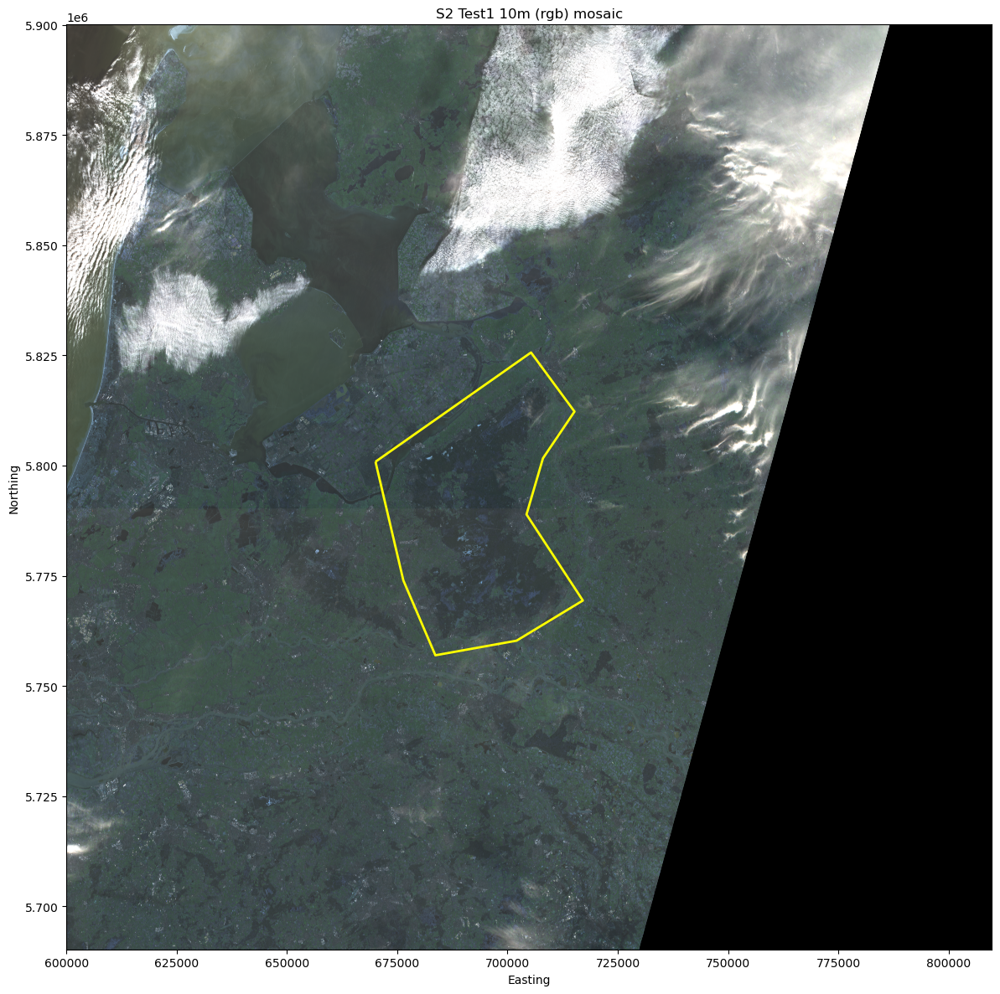

In [ ]:
# S2 Test1 10m
fig, ax = quick_rgb_raster_plot_func(
    S2_test1_10m_UTM32631_mosaic_path,
    geopackages=[veluwe_polygon__ruim__UTM32631__gdf],
    rgb_idx=(0, 1, 2),
    title="S2 Test1 10m (rgb) mosaic"
)
plt.show()

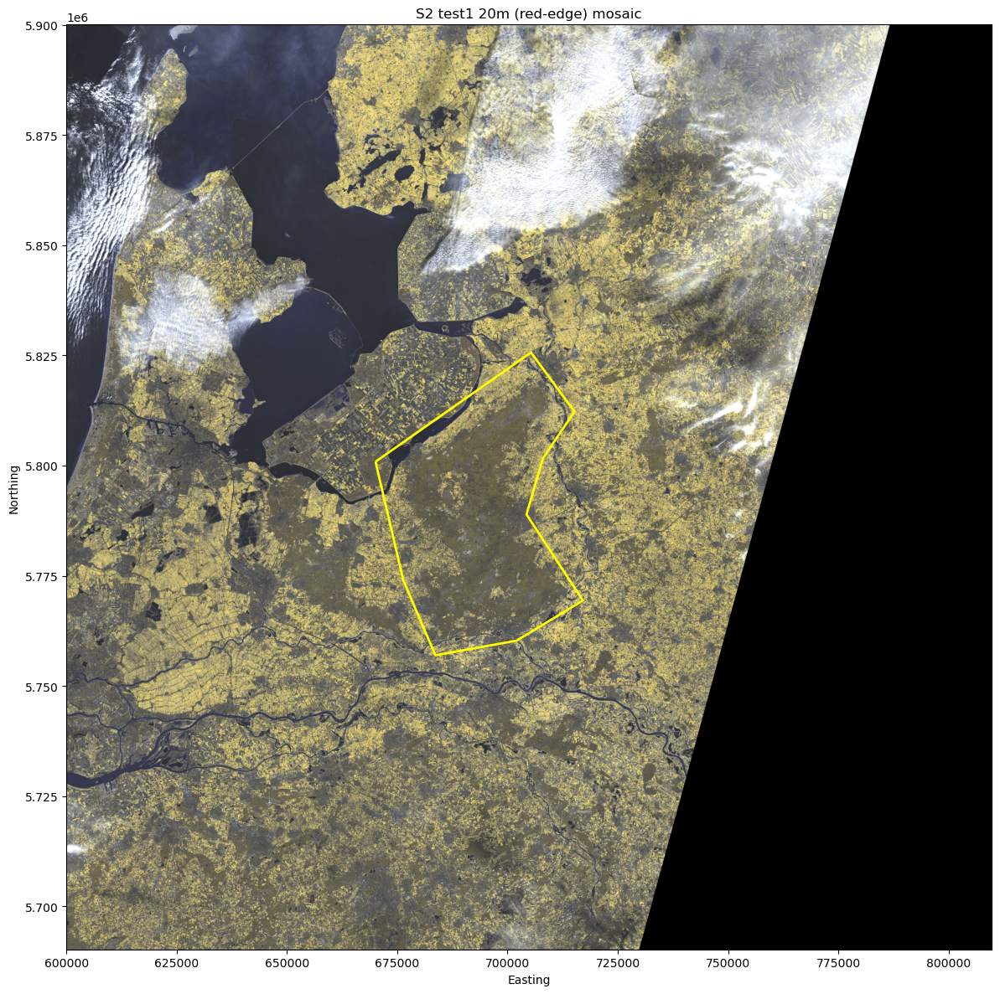

In [ ]:
# S2 Test1 20m
fig, ax = quick_rgb_raster_plot_func(
    S2_test1_20m_UTM32631_mosaic_path,
    geopackages=[veluwe_polygon__ruim__UTM32631__gdf],
    rgb_idx=(2, 1, 0),
    title="S2 test1 20m (red-edge) mosaic"
)
plt.show()

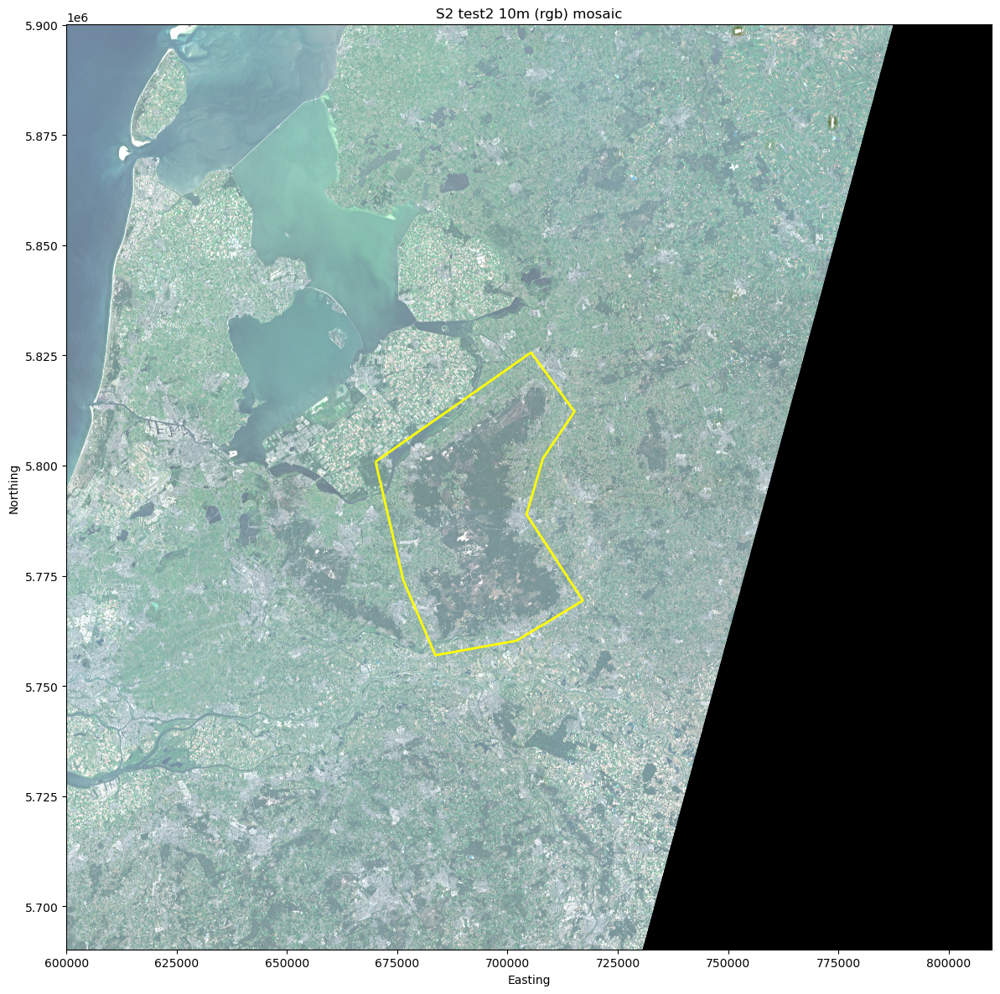

In [ ]:
# S2 Test2 10m
fig, ax = quick_rgb_raster_plot_func(
    S2_test2_10m_UTM32631_mosaic_path,
    geopackages=[veluwe_polygon__ruim__UTM32631__gdf],
    rgb_idx=(2, 1, 0),
    title="S2 test2 10m (rgb) mosaic"
)
plt.show()

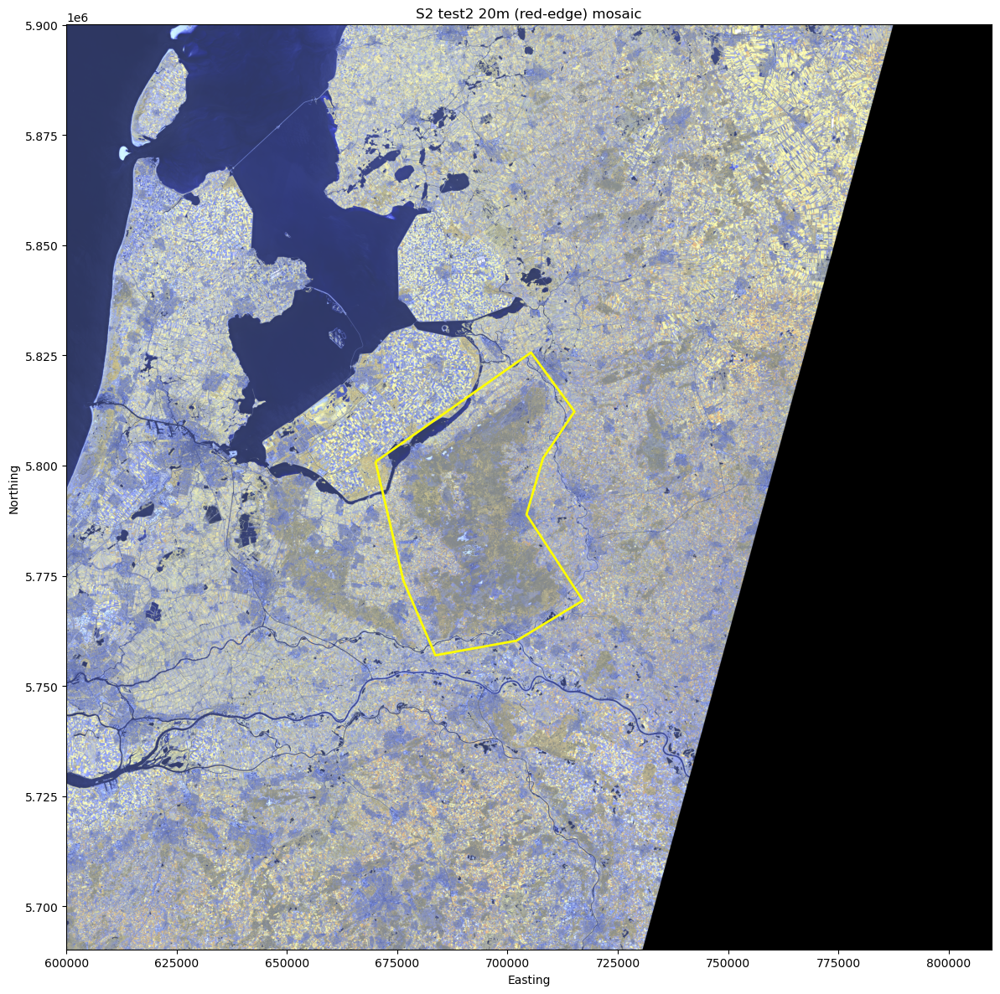

In [ ]:
# S2 Test2 20m
fig, ax = quick_rgb_raster_plot_func(
    S2_test2_20m_UTM32631_mosaic_path,
    geopackages=[veluwe_polygon__ruim__UTM32631__gdf],
    rgb_idx=(2, 1, 0),
    title="S2 test2 20m (red-edge) mosaic"
)
plt.show()

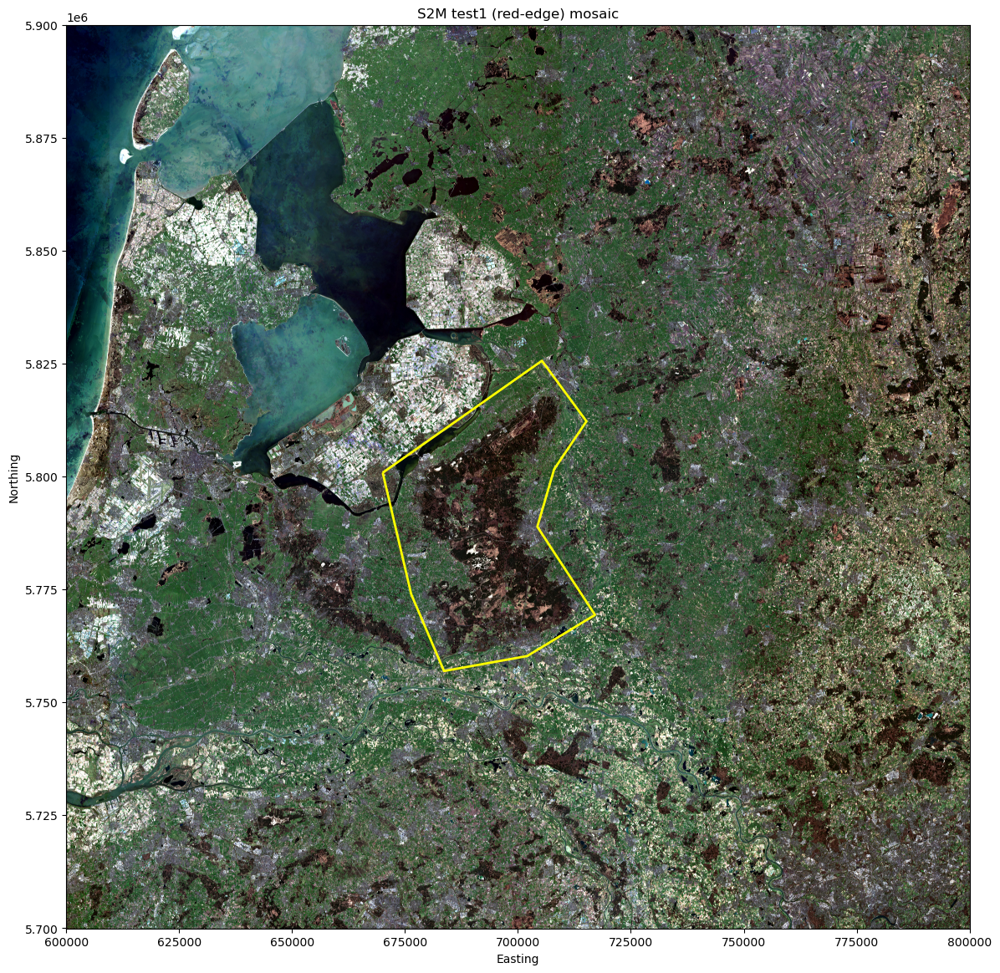

In [ ]:
# S2M Test1
fig, ax = quick_rgb_raster_plot_func(
    S2M_test1_UTM32631_mosaic_path,
    geopackages=[veluwe_polygon__ruim__UTM32631__gdf],
    rgb_idx=(2, 1, 0),
    title="S2M test1 (red-edge) mosaic"
)
plt.show()

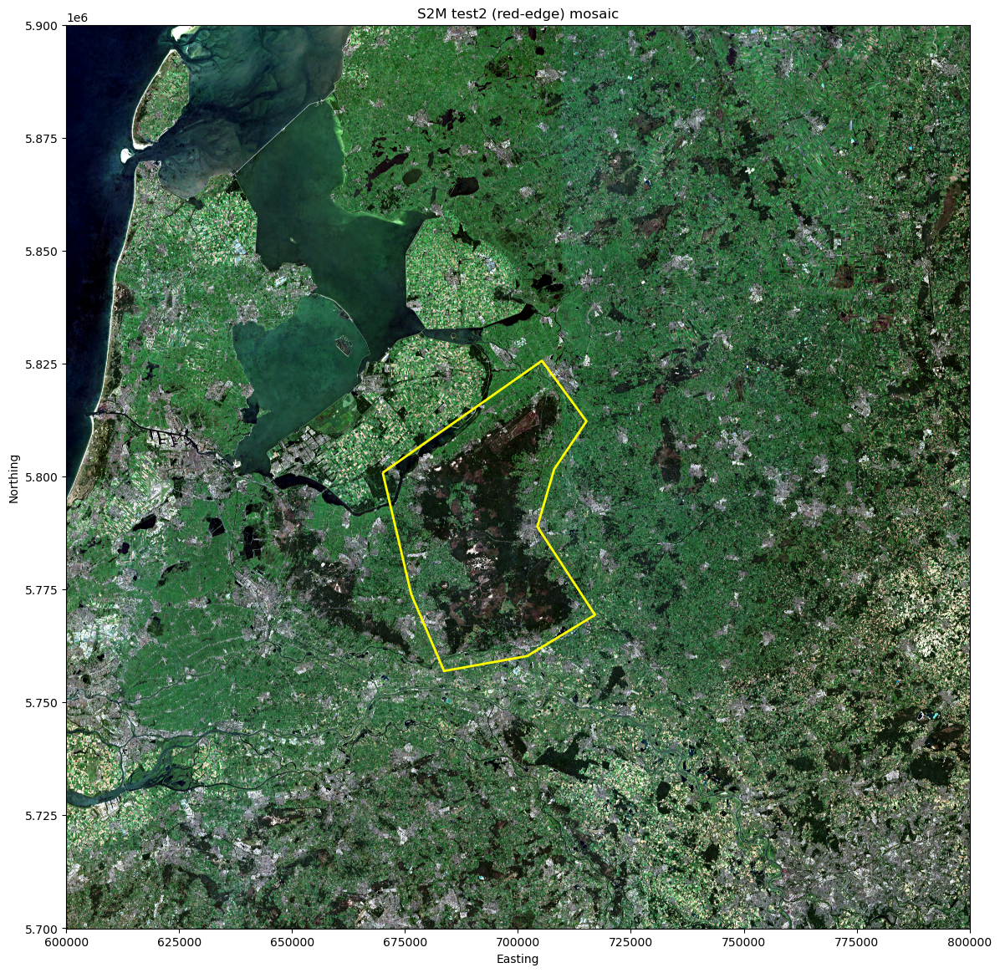

In [ ]:
# S2M Test2
fig, ax = quick_rgb_raster_plot_func(
    S2M_test2_UTM32631_mosaic_path,
    geopackages=[veluwe_polygon__ruim__UTM32631__gdf],
    rgb_idx=(2, 1, 0),
    title="S2M test2 (red-edge) mosaic"
)
plt.show()

## Getting the Pixel Raster of S2 images

It is chosen to give a unique value of _12345_ to uint rasters and a value of _-1234_ to int rasters. This to check if the extraction of pixel values was successfull

In [ ]:
# Building the raster from the mosaics (UTM before _rstr)

S2_test1_10m_veluwe_clip_ruim_UTM32631_rstr_path = get_pixel_raster_func(
    raster_path=S2_test1_10m_UTM32631_mosaic_path,
    output_dir=S2_test1_10m_veluwe_clip_ruim_UTM32631_rstr_dir,
    output_name="S2_test1_10m_veluwe_clip_ruim_UTM32631_rstr.tif",
    fill_value=12345,
    overwrite=True,
)

S2_test1_20m_veluwe_clip_ruim_UTM32631_rstr_path = get_pixel_raster_func(
    raster_path=S2_test1_20m_UTM32631_mosaic_path,
    output_dir=S2_test1_20m_veluwe_clip_ruim_UTM32631_rstr_dir,
    output_name="S2_test1_20m_veluwe_clip_ruim_UTM32631_rstr.tif",
    fill_value=12345,
    overwrite=True,
)

S2_test2_10m_veluwe_clip_ruim_UTM32631_rstr_path = get_pixel_raster_func(
    raster_path=S2_test2_10m_UTM32631_mosaic_path,
    output_dir=S2_test2_10m_veluwe_clip_ruim_UTM32631_rstr_dir,
    output_name="S2_test2_10m_veluwe_clip_ruim_UTM32631_rstr.tif",
    fill_value=12345,
    overwrite=True,
)

S2_test2_20m_veluwe_clip_ruim_UTM32631_rstr_path = get_pixel_raster_func(
    raster_path=S2_test2_20m_UTM32631_mosaic_path,
    output_dir=S2_test2_20m_veluwe_clip_ruim_UTM32631_rstr_dir,
    output_name="S2_test2_20m_veluwe_clip_ruim_UTM32631_rstr.tif",
    fill_value=12345,
    overwrite=True,
)

S2M_test1_veluwe_clip_ruim_UTM32631_rstr_path = get_pixel_raster_func(
    raster_path=S2M_test1_UTM32631_mosaic_path,
    output_dir=S2M_test1_veluwe_clip_ruim_UTM32631_rstr_dir,
    output_name="S2M_test1_veluwe_clip_ruim_UTM32631_rstr.tif",
    fill_value=-1234,
    overwrite=True,
)

S2M_test2_veluwe_clip_ruim_UTM32631_rstr_path = get_pixel_raster_func(
    raster_path=S2M_test2_UTM32631_mosaic_path,
    output_dir=S2M_test2_veluwe_clip_ruim_UTM32631_rstr_dir,
    output_name="S2M_test2_veluwe_clip_ruim_UTM32631_rstr.tif",
    fill_value=-1234,
    overwrite=True,
)

get_pixel_raster_func complete. An empty raster (filled with 12345) with CRS EPSG:32631 was saved to: D:\Thesis\10.Thesis_Data\00_basismaps_raw\sentinel_2_rasters\raster_building\s2_test1\veluwe_clip_ruim\S2_test1_10m_veluwe_clip_ruim_UTM32631_rstr.tif
get_pixel_raster_func complete. An empty raster (filled with 12345) with CRS EPSG:32631 was saved to: D:\Thesis\10.Thesis_Data\00_basismaps_raw\sentinel_2_rasters\raster_building\s2_test1\veluwe_clip_ruim\S2_test1_20m_veluwe_clip_ruim_UTM32631_rstr.tif
get_pixel_raster_func complete. An empty raster (filled with 12345) with CRS EPSG:32631 was saved to: D:\Thesis\10.Thesis_Data\00_basismaps_raw\sentinel_2_rasters\raster_building\s2_test2\veluwe_clip_ruim\S2_test2_10m_veluwe_clip_ruim_UTM32631_rstr.tif
get_pixel_raster_func complete. An empty raster (filled with 12345) with CRS EPSG:32631 was saved to: D:\Thesis\10.Thesis_Data\00_basismaps_raw\sentinel_2_rasters\raster_building\s2_test2\veluwe_clip_ruim\S2_test2_20m_veluwe_clip_ruim_UTM326

## Comparing the rasters

In [ ]:
# test1 10m vs test2 10m
compare_alignment_tifs([S2_test1_10m_veluwe_clip_ruim_UTM32631_rstr_path, S2_test2_10m_veluwe_clip_ruim_UTM32631_rstr_path])

=== Reference Raster (0) ===
path: D:\Thesis\10.Thesis_Data\00_basismaps_raw\sentinel_2_rasters\s2_test1\veluwe_clip_ruim\S2_test1_10m_veluwe_clip_ruim_UTM32631_rstr.tif
crs: EPSG:32631
width: 20976
height: 20982
res: (10.0, 10.0)
bounds: BoundingBox(left=600000.0, bottom=5690220.0, right=809760.0, top=5900040.0)
transform: | 10.00, 0.00, 600000.00|
| 0.00,-10.00, 5900040.00|
| 0.00, 0.00, 1.00|

=== Raster 1 ===
path: D:\Thesis\10.Thesis_Data\00_basismaps_raw\sentinel_2_rasters\s2_test2\veluwe_clip_ruim\S2_test2_10m_veluwe_clip_ruim_UTM32631_rstr.tif
crs: EPSG:32631
width: 20976
height: 20982
res: (10.0, 10.0)
bounds: BoundingBox(left=600000.0, bottom=5690220.0, right=809760.0, top=5900040.0)
transform: | 10.00, 0.00, 600000.00|
| 0.00,-10.00, 5900040.00|
| 0.00, 0.00, 1.00|

--- Comparison vs reference ---
crs: True
shape: True
res: True
bounds: True
transform: True
RESULT: ALIGNS

FINAL RESULT: ALL ALIGN EXACTLY


True

In [ ]:
# test1 20m vs test2 20m
compare_alignment_tifs([S2_test1_20m_veluwe_clip_ruim_UTM32631_rstr_path, S2_test2_20m_veluwe_clip_ruim_UTM32631_rstr_path])

=== Reference Raster (0) ===
path: D:\Thesis\10.Thesis_Data\00_basismaps_raw\sentinel_2_rasters\s2_test1\veluwe_clip_ruim\S2_test1_20m_veluwe_clip_ruim_UTM32631_rstr.tif
crs: EPSG:32631
width: 10488
height: 10491
res: (20.0, 20.0)
bounds: BoundingBox(left=600000.0, bottom=5690220.0, right=809760.0, top=5900040.0)
transform: | 20.00, 0.00, 600000.00|
| 0.00,-20.00, 5900040.00|
| 0.00, 0.00, 1.00|

=== Raster 1 ===
path: D:\Thesis\10.Thesis_Data\00_basismaps_raw\sentinel_2_rasters\s2_test2\veluwe_clip_ruim\S2_test2_20m_veluwe_clip_ruim_UTM32631_rstr.tif
crs: EPSG:32631
width: 10488
height: 10491
res: (20.0, 20.0)
bounds: BoundingBox(left=600000.0, bottom=5690220.0, right=809760.0, top=5900040.0)
transform: | 20.00, 0.00, 600000.00|
| 0.00,-20.00, 5900040.00|
| 0.00, 0.00, 1.00|

--- Comparison vs reference ---
crs: True
shape: True
res: True
bounds: True
transform: True
RESULT: ALIGNS

FINAL RESULT: ALL ALIGN EXACTLY


True

In [ ]:
# S2M test1 vs S2M test2
compare_alignment_tifs([S2M_test1_veluwe_clip_ruim_UTM32631_rstr_path, S2M_test2_veluwe_clip_ruim_UTM32631_rstr_path])

=== Reference Raster (0) ===
path: D:\Thesis\10.Thesis_Data\00_basismaps_raw\sentinel_2_rasters\s2m_test1\veluwe_clip_ruim\S2M_test1_veluwe_clip_ruim_UTM32631_rstr.tif
crs: EPSG:32631
width: 20004
height: 20010
res: (10.0, 10.0)
bounds: BoundingBox(left=600000.0, bottom=5699940.0, right=800040.0, top=5900040.0)
transform: | 10.00, 0.00, 600000.00|
| 0.00,-10.00, 5900040.00|
| 0.00, 0.00, 1.00|

=== Raster 1 ===
path: D:\Thesis\10.Thesis_Data\00_basismaps_raw\sentinel_2_rasters\s2m_test2\veluwe_clip_ruim\S2M_test2_veluwe_clip_ruim_UTM32631_rstr.tif
crs: EPSG:32631
width: 20004
height: 20010
res: (10.0, 10.0)
bounds: BoundingBox(left=600000.0, bottom=5699940.0, right=800040.0, top=5900040.0)
transform: | 10.00, 0.00, 600000.00|
| 0.00,-10.00, 5900040.00|
| 0.00, 0.00, 1.00|

--- Comparison vs reference ---
crs: True
shape: True
res: True
bounds: True
transform: True
RESULT: ALIGNS

FINAL RESULT: ALL ALIGN EXACTLY


True

In [ ]:
# S1 test1 10m vs S2M test2
compare_alignment_tifs([S2_test1_10m_veluwe_clip_ruim_UTM32631_rstr_path, S2M_test2_veluwe_clip_ruim_UTM32631_rstr_path])

=== Reference Raster (0) ===
path: D:\Thesis\10.Thesis_Data\00_basismaps_raw\sentinel_2_rasters\s2_test1\veluwe_clip_ruim\S2_test1_10m_veluwe_clip_ruim_UTM32631_rstr.tif
crs: EPSG:32631
width: 20976
height: 20982
res: (10.0, 10.0)
bounds: BoundingBox(left=600000.0, bottom=5690220.0, right=809760.0, top=5900040.0)
transform: | 10.00, 0.00, 600000.00|
| 0.00,-10.00, 5900040.00|
| 0.00, 0.00, 1.00|

=== Raster 1 ===
path: D:\Thesis\10.Thesis_Data\00_basismaps_raw\sentinel_2_rasters\s2m_test2\veluwe_clip_ruim\S2M_test2_veluwe_clip_ruim_UTM32631_rstr.tif
crs: EPSG:32631
width: 20004
height: 20010
res: (10.0, 10.0)
bounds: BoundingBox(left=600000.0, bottom=5699940.0, right=800040.0, top=5900040.0)
transform: | 10.00, 0.00, 600000.00|
| 0.00,-10.00, 5900040.00|
| 0.00, 0.00, 1.00|

--- Comparison vs reference ---
crs: True
shape: False
res: True
bounds: False
transform: True
RESULT: DOES NOT ALIGN

FINAL RESULT: NOT ALL ALIGN EXACTLY


False

_Note that all raster files perfectly align. The only exeption is the mosaic vs single image. But this is due to a bounds error. Which is logical and can also be seen on the plots._

## Clip the raster mosaic to ruime Veluwe polygon

In [ ]:
s2_basisraster__10m__UTM32631__rstr_path, s2_basisraster__10m__UTM32631__rstr_epsg, s2_basisraster__10m__UTM32631__rstr_status = clip_with_rasterio_func(
                        raster_path=S2_test1_10m_veluwe_clip_ruim_UTM32631_rstr_path,
                        gpkg_path=veluwe_polygon__ruim__UTM32631__gpkg_path,
                        out_dir=s2_basisraster__dir,
                        out_filename="s2_basisraster__10m__UTM32631__rstr.tif",
                        overwrite=True)

s2_basisraster__20m__UTM32631__rstr_path, s2_basisraster__20m__UTM32631__rstr_epsg, s2_basisraster__20m__UTM32631__rstr_status = clip_with_rasterio_func(
                        raster_path=S2_test1_20m_veluwe_clip_ruim_UTM32631_rstr_path,
                        gpkg_path=veluwe_polygon__ruim__UTM32631__gpkg_path,
                        out_dir=s2_basisraster__dir,
                        out_filename="s2_basisraster__20m__UTM32631.tif",
                        overwrite=True)

Clipped raster (EPSG:32631) written to: D:\Thesis\10.Thesis_Data\01_basismaps_processed\sentinel_2_basisraster\s2_basisraster__10m__UTM32631__rstr.tif
Clipped raster (EPSG:32631) written to: D:\Thesis\10.Thesis_Data\01_basismaps_processed\sentinel_2_basisraster\s2_basisraster__20m__UTM32631.tif


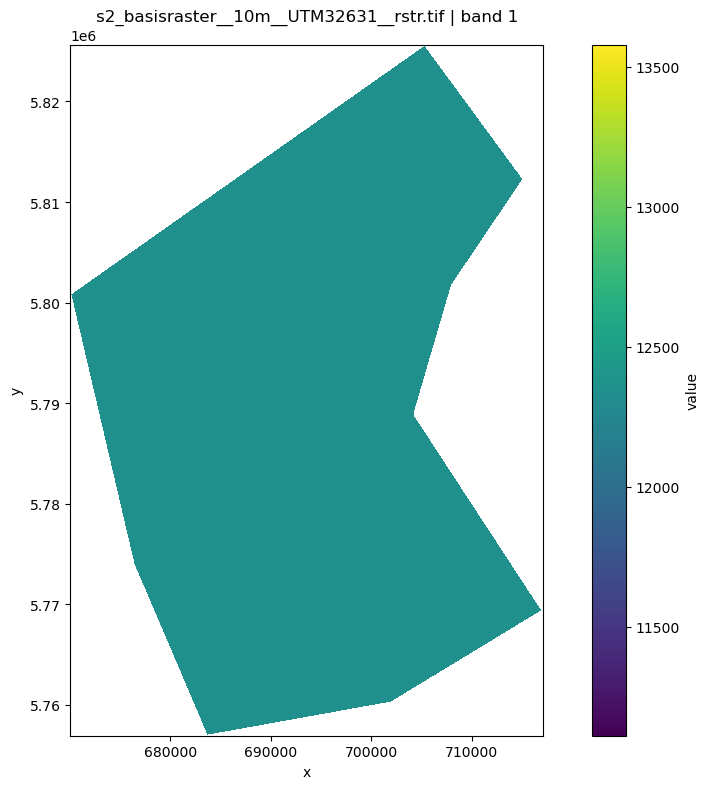

In [ ]:
quick_rstr_plot_func(s2_basisraster__10m__UTM32631__rstr_path)

## Save raster as pixelled polygon

In [ ]:
out = raster_pixels_to_gpkg(
    raster_path=s2_basisraster__10m__UTM32631__rstr_path,
    gpkg_path=s2_basisraster__10m__UTM32631__gpkg_path,
    layer_name="s2_basisraster__10m__UTM32631__layer",
    band=1,
    drop_nodata=True,
    chunk_size=1024,
)
print(out)

D:\Thesis\10.Thesis_Data\01_basismaps_processed\sentinel_2_basisraster\s2_basisraster__10m__UTM32631__gpkg.gpkg


In [ ]:
out = raster_pixels_to_gpkg(
    raster_path=s2_basisraster__20m__UTM32631__rstr_path,
    gpkg_path=s2_basisraster__20m__UTM32631__gpkg_path,
    layer_name="s2_basisraster__20m__UTM32631__layer",
    band=1,
    drop_nodata=True,
    chunk_size=1024,
)
print(out)

D:\Thesis\10.Thesis_Data\01_basismaps_processed\sentinel_2_basisraster\s2_basisraster__20m__UTM32631__gpkg.gpkg


## Reprojecting the export clipping rasters

Reprojecting of the GPKGs is done in QGIS. These 

End of the Notebook